# The Effect of Scrambling Image on Training CNN-Based Classifiers  

Here we explore the effect of a random scrambling of the input image (shuffling pixels pixels) on classification in three tasks: case  
 - MNIST
 - Fashion-MNIST
 - CIFAR10

First, we expect no effect on fully-connected networks. For CNN-based networks, this is expected to significantly interfere with the networks ability to learn. An interesting question that one can ask is whether or not the classification ability of a CNN-network can be recovered by making the network deeper and narrower at the same time to increase the receptive fields.

In [1]:
import sys
import os

import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

sys.path.append(
    os.path.dirname(os.getcwd())
)
from utilities.tile_image_plot_utilities import \
    custom_tile_image_plot, custom_tile_plot_with_inference_hists
from utilities.generator_utilities import ScrambledImageDataGenerator


------
# MNIST Dataset

In [2]:
# Get test and train features and labels for the MNIST dataset:
mnist = tf.keras.datasets.mnist
mnist_train, mnist_test = mnist.load_data()

# Check the type and size of the test and train features and labels:
print("Train data:   ", mnist_train[0].shape)
print("Train labels: ", mnist_train[1].shape)
print("Test data:    ", mnist_test[0].shape)
print("Test labels:  ", mnist_test[1].shape)

Train data:    (60000, 28, 28)
Train labels:  (60000,)
Test data:     (10000, 28, 28)
Test labels:   (10000,)


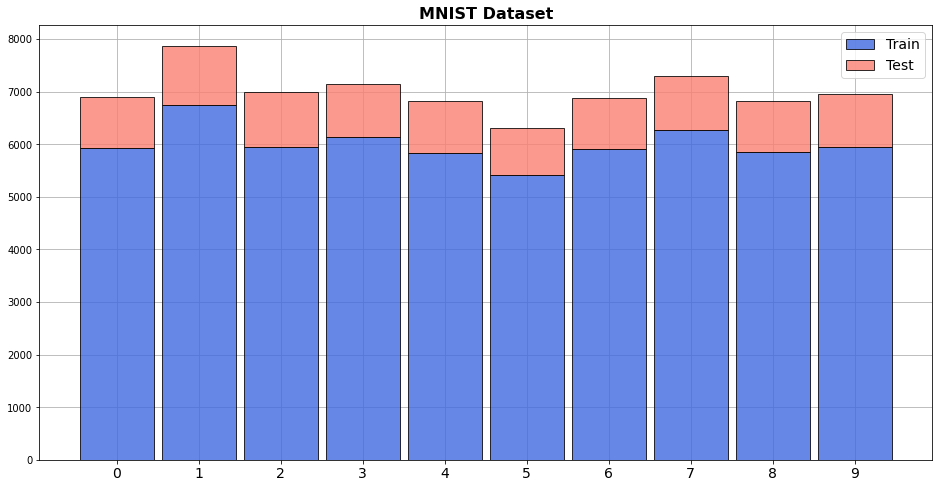

In [3]:
fig = plt.figure(figsize=(16., 8.))
bins = np.linspace(start=-0.5, stop=9.5, num=11, endpoint=True)
bar_heights, _, _ = plt.hist(mnist_train[1], bins=bins, 
         color="royalblue", edgecolor="black", alpha=0.8, 
         rwidth=0.9, align="mid", label="Train")
plt.hist(mnist_test[1], bins=bins, bottom=bar_heights,
         color="salmon", edgecolor="black", alpha=0.8, 
         rwidth=0.9, align="mid", label="Test")
plt.xticks(np.arange(10), labels=np.arange(10), 
           fontsize=14., fontweight="normal")
plt.legend(fontsize=14.)
plt.title("MNIST Dataset", fontsize=16., fontweight="bold")
plt.grid()
plt.gca().set_axisbelow(True)
plt.show()

## Unscrambled Images

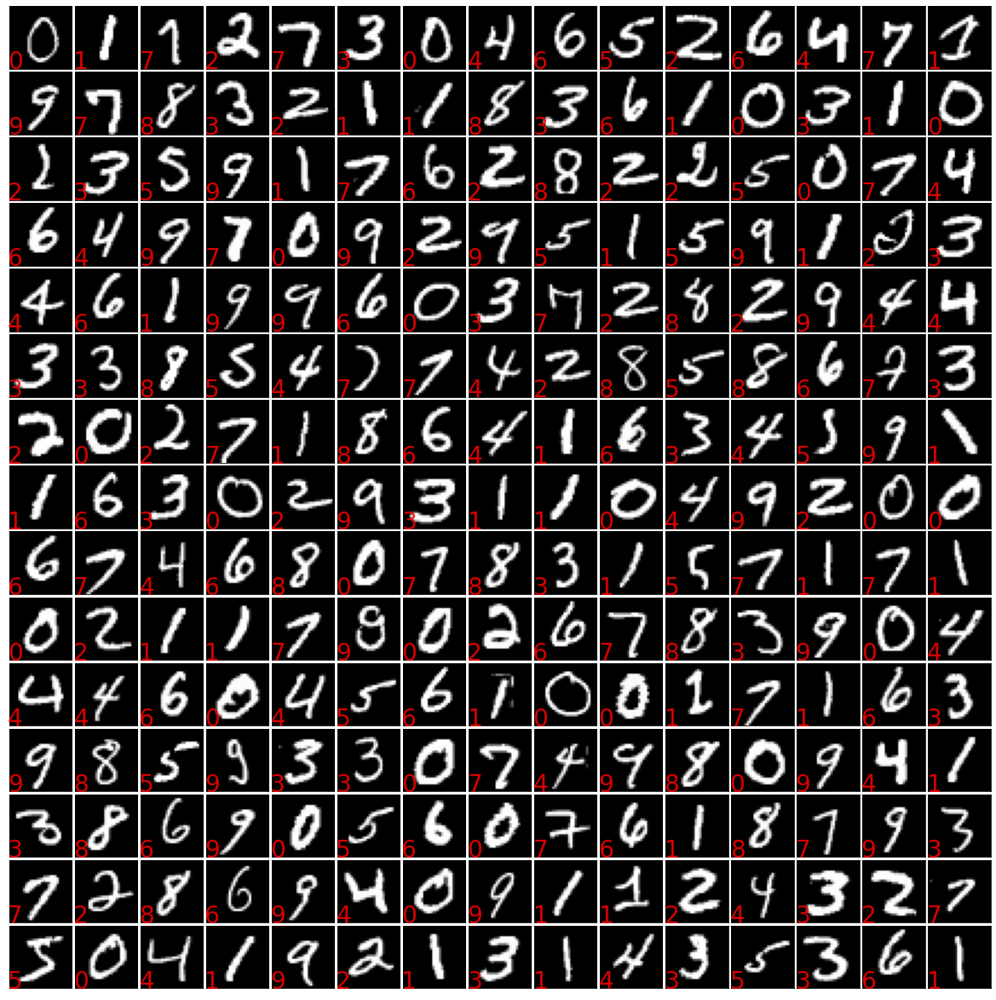

In [4]:
# Visualize some of the images:
image_gen = ScrambledImageDataGenerator( 
    features=mnist_train[0][0:256,:,:],
    labels=mnist_train[1][0:256],
    batch_size=255,
    scrambler_array=None,
    normalize=True)

custom_tile_image_plot( 
    (15,15),
    image_gen[0][0],
    labels=image_gen[0][1],
    label_size=28.,
    label_color="red",
    filename="",
    figure_size=(16., 16.))

## Scramble Images:

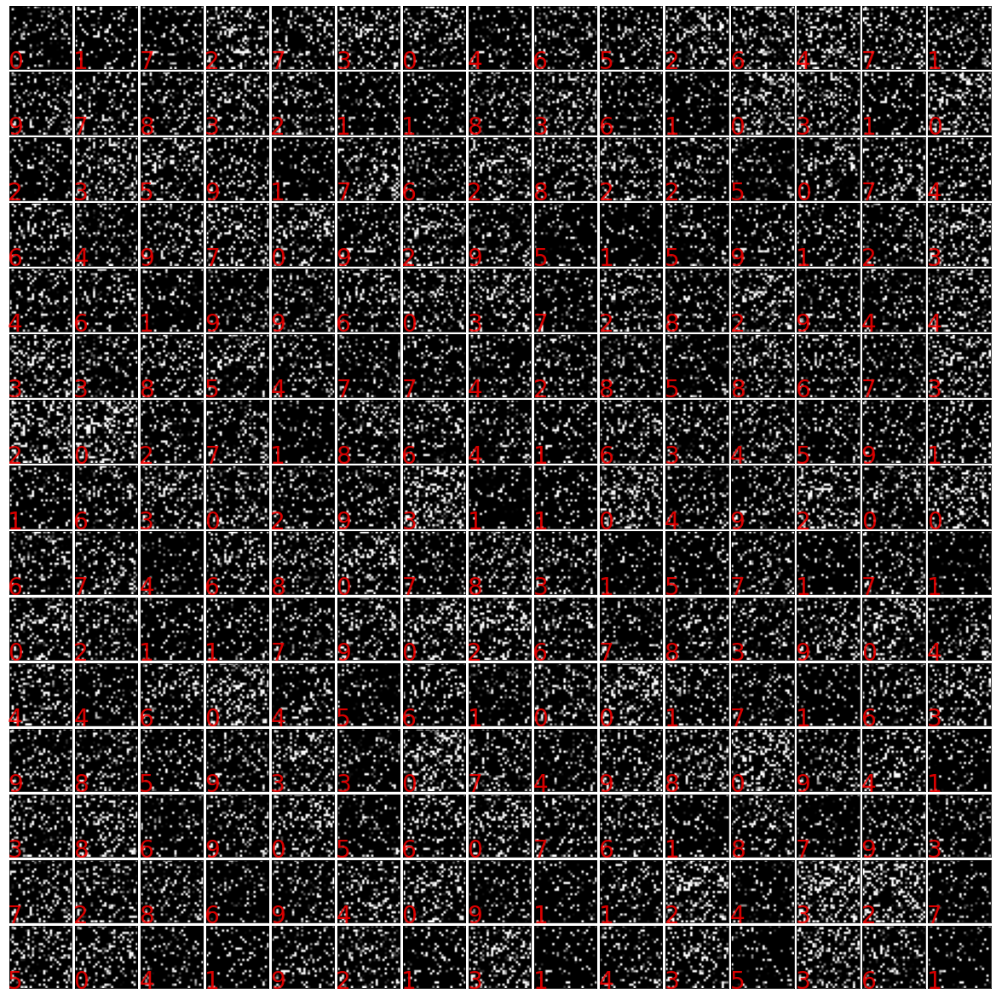

In [5]:
# Visualize scrampled images:
num_pixels = 28 * 28
scrambler = np.random.randint(
    low=0, high=num_pixels, size=num_pixels)

scrambled_image_gen = ScrambledImageDataGenerator(
    features=mnist_train[0][0:256,:,:],
    labels=mnist_train[1][0:256],
    batch_size=255,
    scrambler_array=scrambler,
    normalize=True)
 
custom_tile_image_plot( 
    (15,15),
    scrambled_image_gen[0][0],
    labels=scrambled_image_gen[0][1],
    label_size=28.,
    label_color="red",
    filename="",
    figure_size=(16., 16.))

<br><br><br>

----
# Fashion MNIST Dataset

In [6]:
# Get test and train features and labels for the MNIST dataset:
fashion_mnist = tf.keras.datasets.fashion_mnist
fmnist_train, fmnist_test = fashion_mnist.load_data()

# Check the type and size of the test and train features and labels:
print("Train data:   ", fmnist_train[0].shape)
print("Train labels: ", fmnist_train[1].shape)
print("Test data:    ", fmnist_test[0].shape)
print("Test labels:  ", fmnist_test[1].shape)

Train data:    (60000, 28, 28)
Train labels:  (60000,)
Test data:     (10000, 28, 28)
Test labels:   (10000,)


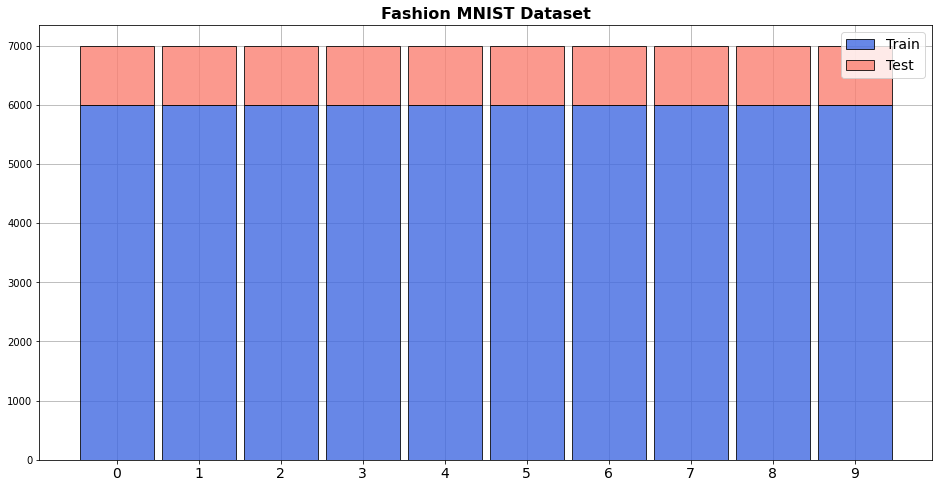

In [7]:
fig = plt.figure(figsize=(16., 8.))
bins = np.linspace(start=-0.5, stop=9.5, num=11, endpoint=True)
bar_heights, _, _ = plt.hist(fmnist_train[1], bins=bins, 
         color="royalblue", edgecolor="black", alpha=0.8, 
         rwidth=0.9, align="mid", label="Train")
plt.hist(fmnist_test[1], bins=bins, bottom=bar_heights,
         color="salmon", edgecolor="black", alpha=0.8, 
         rwidth=0.9, align="mid", label="Test")
plt.xticks(np.arange(10), labels=np.arange(10), 
           fontsize=14., fontweight="normal")
plt.legend(fontsize=14.)
plt.title("Fashion MNIST Dataset", fontsize=16., fontweight="bold")
plt.grid()
plt.gca().set_axisbelow(True)
plt.show()

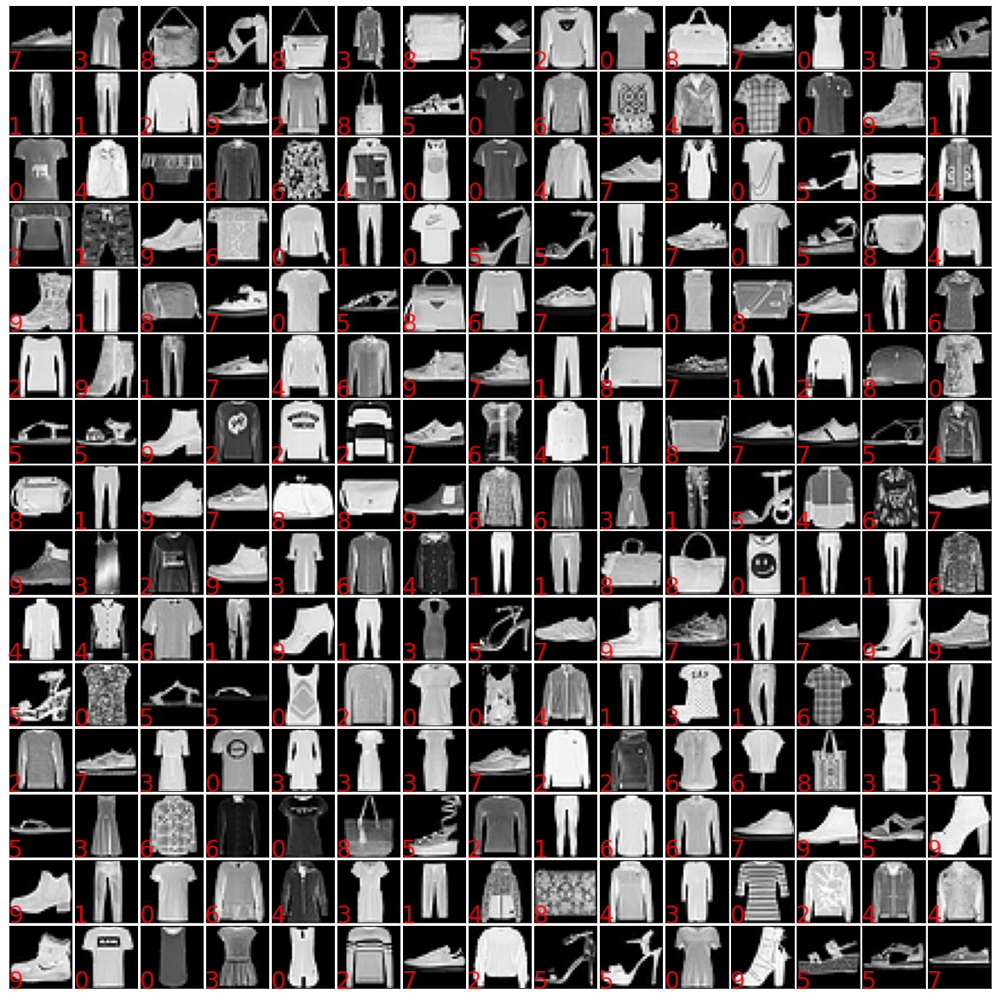

In [8]:
# Visualize some of the images:
image_gen = ScrambledImageDataGenerator( 
    features=fmnist_train[0][0:256,:,:],
    labels=fmnist_train[1][0:256],
    batch_size=255,
    scrambler_array=None,
    normalize=True)

custom_tile_image_plot( 
    (15,15),
    image_gen[0][0],
    labels=image_gen[0][1],
    label_size=28.,
    label_color="red",
    filename="",
    figure_size=(16., 16.))

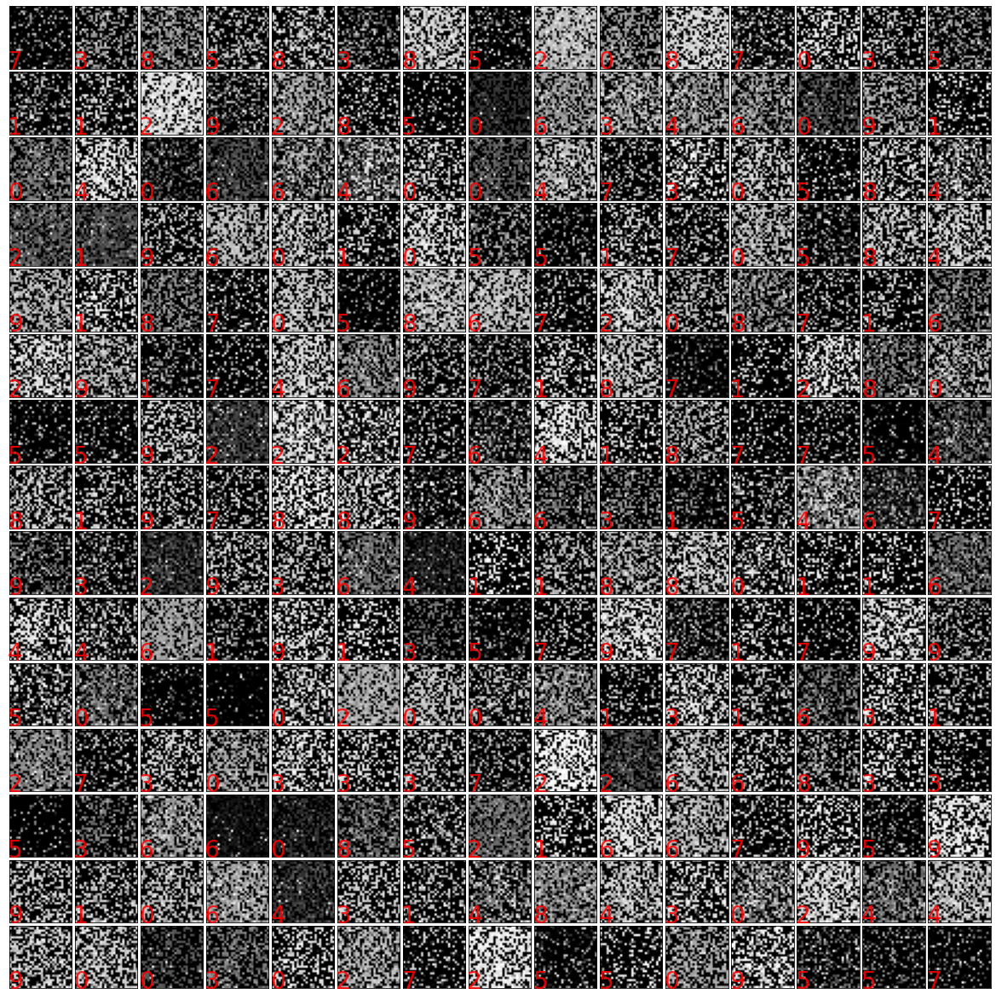

In [9]:
# Visualize scrampled images:
num_pixels = 28 * 28
scrambler = np.random.randint(
    low=0, high=num_pixels, size=num_pixels)

scrambled_image_gen = ScrambledImageDataGenerator(
    features=fmnist_train[0][0:256,:,:],
    labels=fmnist_train[1][0:256],
    batch_size=255,
    scrambler_array=scrambler,
    normalize=True)
 
custom_tile_image_plot( 
    (15,15),
    scrambled_image_gen[0][0],
    labels=scrambled_image_gen[0][1],
    label_size=28.,
    label_color="red",
    filename="",
    figure_size=(16., 16.))

<br><br><br>

----
# CIFAR-10 Dataset

In [10]:
# Get test and train features and labels for the MNIST dataset:
cifar10 = tf.keras.datasets.cifar10
cifar10_train, cifar10_test = cifar10.load_data()

# Check the type and size of the test and train features and labels:
print("Train data:   ", cifar10_train[0].shape)
print("Train labels: ", cifar10_train[1].shape)
print("Test data:    ", cifar10_test[0].shape)
print("Test labels:  ", cifar10_test[1].shape)

Train data:    (50000, 32, 32, 3)
Train labels:  (50000, 1)
Test data:     (10000, 32, 32, 3)
Test labels:   (10000, 1)


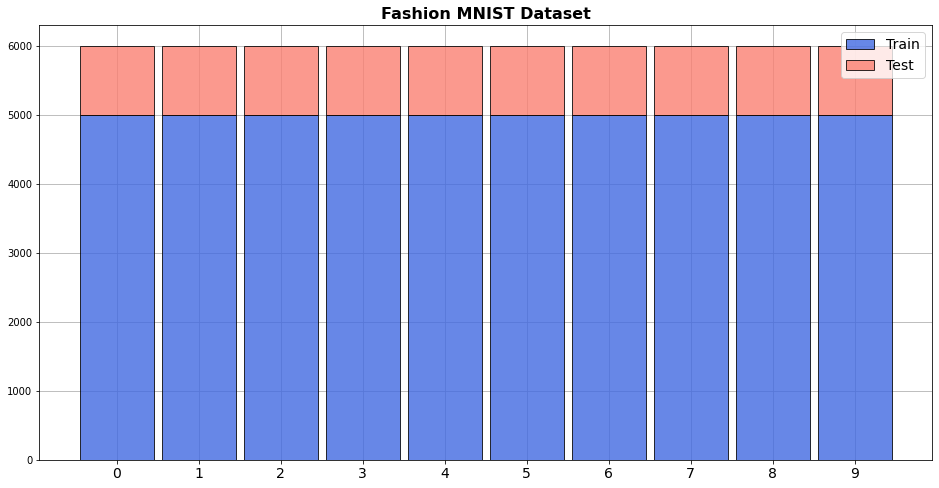

In [11]:
fig = plt.figure(figsize=(16., 8.))
bins = np.linspace(start=-0.5, stop=9.5, num=11, endpoint=True)
bar_heights, _, _ = plt.hist(cifar10_train[1], bins=bins, 
         color="royalblue", edgecolor="black", alpha=0.8, 
         rwidth=0.9, align="mid", label="Train")
plt.hist(cifar10_test[1], bins=bins, bottom=bar_heights,
         color="salmon", edgecolor="black", alpha=0.8, 
         rwidth=0.9, align="mid", label="Test")
plt.xticks(np.arange(10), labels=np.arange(10), 
           fontsize=14., fontweight="normal")
plt.legend(fontsize=14.)
plt.title("Fashion MNIST Dataset", fontsize=16., fontweight="bold")
plt.grid()
plt.gca().set_axisbelow(True)
plt.show()

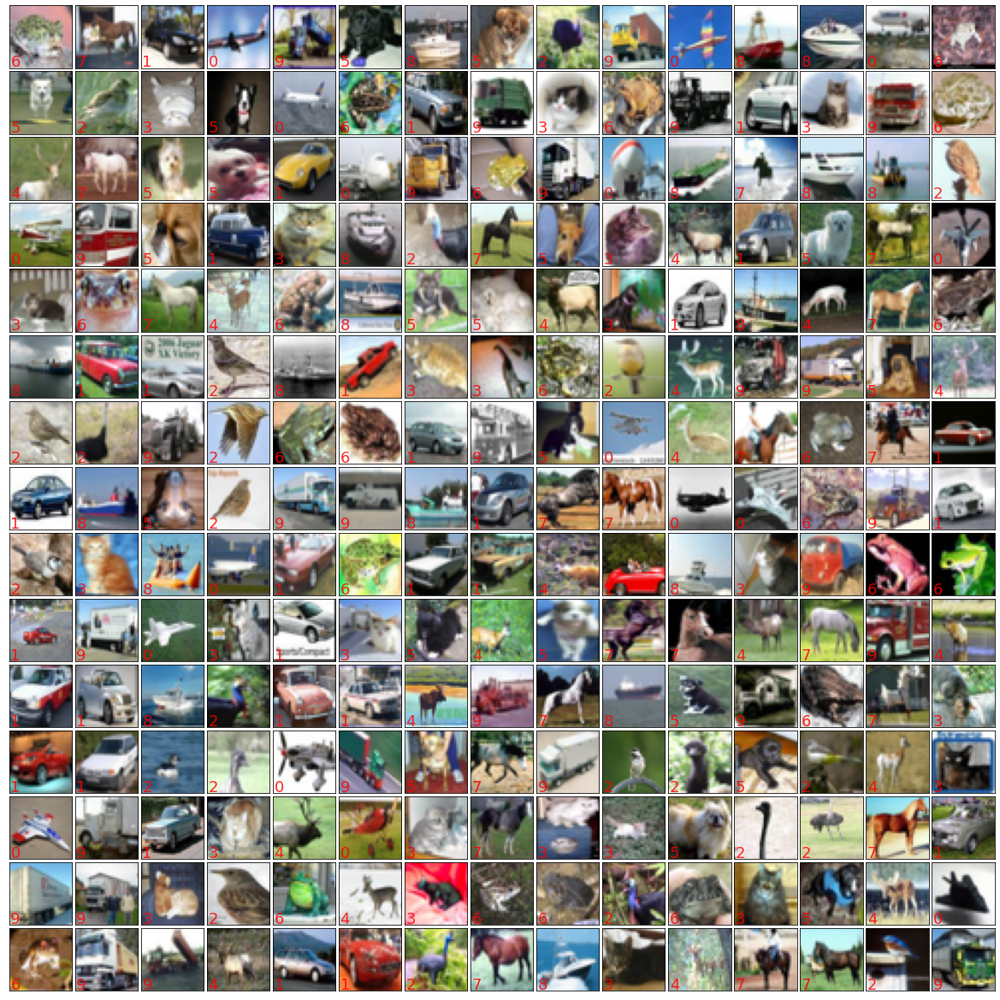

In [12]:
# Visualize some of the images:
image_gen = ScrambledImageDataGenerator( 
    features=cifar10_train[0][0:256,:,:],
    labels=cifar10_train[1][0:256, 0],
    batch_size=255,
    scrambler_array=None,
    normalize=True)

custom_tile_image_plot( 
    (15,15),
    image_gen[0][0],
    labels=image_gen[0][1],
    label_size=18.,
    label_color="red",
    filename="",
    figure_size=(16., 16.))

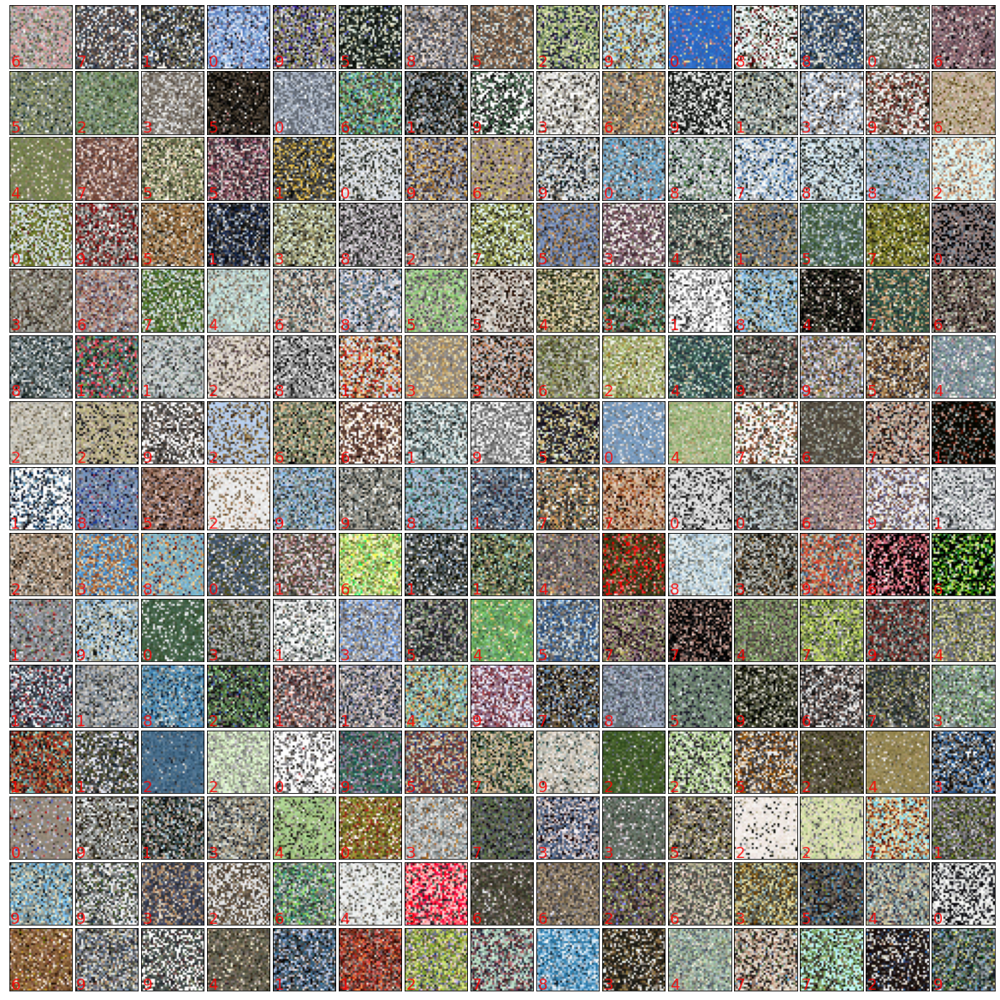

In [13]:
# Visualize scrampled images:
num_pixels = 32 * 32
scrambler = np.random.randint(
    low=0, high=num_pixels, size=num_pixels)

scrambled_image_gen = ScrambledImageDataGenerator(
    features=cifar10_train[0][0:256,:,:],
    labels=cifar10_train[1][0:256, 0],
    batch_size=255,
    scrambler_array=scrambler,
    normalize=True)
 
custom_tile_image_plot( 
    (15,15),
    scrambled_image_gen[0][0],
    labels=scrambled_image_gen[0][1],
    label_size=18.,
    label_color="red",
    filename="",
    figure_size=(16., 16.))

In [ ]:
# ## Model Constructor
# def FCNClassifierModelConstructor( input_shape,
#                                    numb_classes,
#                                    hidden_layers_map={1:16,2:32,3:64,4:32,5:32,6:16,7:8},
#                                    activation=tf.nn.relu              ):
#     """
#     Constructs and retursn a fully connected tf.keras model.
    
#     Args:
#         input_shape (tuple):      Input shape.
#         numb_classes (int):       Number of classes (output layer size).
#         hidden_layers_map (dict): If provided, the *hidden* layers are constructed as outlined. 
#                                   Note that this dictionary excludes the last layer!
#         activation (tf.nn):       An instance of activation function.
    
#     Returns:
#         tf.keras.model
#     """
#     input_size=1
#     for d in input_shape:
#         input_size *= d
#     #
#     ## Construct model
#     model_ = tf.keras.models.Sequential()
#     model_.add( tf.keras.layers.Flatten( input_shape=input_shape,
#                                          name="Flatten" ) )
#     for l in sorted(hidden_layers_map,reverse=False):
#         if( l==1 ):
#             model_.add( tf.keras.layers.Dense( hidden_layers_map[l],
#                                                input_dim=input_size,
#                                                activation=activation,
#                                                use_bias=True,
#                                                kernel_initializer='glorot_uniform',
#                                                bias_initializer='zeros',
#                                                kernel_regularizer=None,
#                                                bias_regularizer=None,
#                                                activity_regularizer=None,
#                                                kernel_constraint=None,
#                                                bias_constraint=None,
#                                                name="Dense_"+str(l)     ) )
#         else:
#             model_.add( tf.keras.layers.Dense(  hidden_layers_map[l],  
#                                                 activation=activation,
#                                                 use_bias=True,
#                                                 kernel_initializer='glorot_uniform',
#                                                 bias_initializer='zeros',
#                                                 kernel_regularizer=None,
#                                                 bias_regularizer=None,
#                                                 activity_regularizer=None,
#                                                 kernel_constraint=None,
#                                                 bias_constraint=None,
#                                                 name="Dense_"+str(l)     ) )
#     model_.add( tf.keras.layers.Dense(numb_classes, activation=tf.nn.softmax,name="Softmax") )
#     #
#     return model_

# def CNNClassifierModelConstructor( input_shape,
#                                    numb_classes,
#                                    cnn_layers_map={1:(16, (4,4), (1,1), (4,4), (1,1)),
#                                                    2:(16, (4,4), (1,1), (4,4), (1,1)),
#                                                    3:(16, (4,4), (1,1), (4,4), (1,1)),
#                                                    4:(16, (4,4), (1,1), None,   None),
#                                                    5:(16, (4,4), (1,1), None,   None) },
#                                    fcn_layers_map={1:64,2:32},
#                                    cnn_activation=tf.nn.relu,
#                                    fcn_activation=tf.nn.relu,
#                                    padding='valid',
#                                    data_format='channels_last' ):
#     """
#     Constructs and retursn a CNN tf.keras model.
    
#     Args:
#         input_shape (tuple):    Input shape.
#         numb_classes (int):     Number of classes (output layer size).
#         cnn_layers_map (dict):  If provided, the *convolutional* layers are constructed as outlined. It is 
#                                 a dictionary with layer number as key and 5-dimensional tuple as value. The 
#                                 last two elements in the tuple are pertinent to the max pool layers. If set
#                                 to None, max pooling will be skipped. 
#         fcn_layers_map (dict):  If provided, the *fully connected* layers are constructed as outlined.  
#                                 Note that this dictionary excludes the last layer!
#         cnn_activation (tf.nn): An instance of activation function.
#         fcn_activation (tf.nn): An instance of activation function.
#         padding (str):          Type of padding for CNN and MaxPool layers: 'valid' or 'simple'
#         data_format (str):      Data format of the input:
#                                        channels_first <---> (batch, height, width, channels)
#                                        channels_last  <---> (batch, channels, height, width)
    
#     Returns:
#         tf.keras.model
#     """
#     model_ = tf.keras.models.Sequential()
#     for l in sorted(cnn_layers_map,reverse=False):
#         if( l==1 ):
#             model_.add( tf.keras.layers.Conv2D( input_shape=input_shape,
#                                                 filters=cnn_layers_map[l][0],
#                                                 kernel_size=cnn_layers_map[l][1],
#                                                 strides=cnn_layers_map[l][2],
#                                                 padding=padding,
#                                                 data_format=data_format,
#                                                 dilation_rate=(1,1),
#                                                 activation=cnn_activation,
#                                                 use_bias=True,
#                                                 kernel_initializer='glorot_uniform',
#                                                 bias_initializer='zeros',
#                                                 kernel_regularizer=None,
#                                                 bias_regularizer=None,
#                                                 activity_regularizer=None,
#                                                 kernel_constraint=None,
#                                                 bias_constraint=None,
#                                                 name="CNN_"+str(l)     ) )
#             if( cnn_layers_map[l][3] is not None ):
#                 model_.add( tf.keras.layers.MaxPool2D( pool_size=cnn_layers_map[l][3],
#                                                        strides=cnn_layers_map[l][4],
#                                                        padding=padding,
#                                                        data_format=None, 
#                                                        name="MaxPool_"+str(l)     ) )
            
#         else:
#             model_.add( tf.keras.layers.Conv2D( filters=cnn_layers_map[l][0],
#                                                 kernel_size=cnn_layers_map[l][1],
#                                                 strides=cnn_layers_map[l][2],
#                                                 padding=padding,
#                                                 data_format=data_format,
#                                                 dilation_rate=(1,1),
#                                                 activation=cnn_activation,
#                                                 use_bias=True,
#                                                 kernel_initializer='glorot_uniform',
#                                                 bias_initializer='zeros',
#                                                 kernel_regularizer=None,
#                                                 bias_regularizer=None,
#                                                 activity_regularizer=None,
#                                                 kernel_constraint=None,
#                                                 bias_constraint=None,
#                                                 name="CNN_"+str(l)     ) )
#             if( cnn_layers_map[l][3] is not None ):
#                 model_.add( tf.keras.layers.MaxPool2D( pool_size=cnn_layers_map[l][3],
#                                                        strides=cnn_layers_map[l][4],
#                                                        padding=padding,
#                                                        data_format=None, 
#                                                        name="MaxPool_"+str(l)     ) )
#     model_.add(tf.keras.layers.Flatten( name="Flatten" ))
#     for l in sorted(fcn_layers_map,reverse=False):
#         model_.add( tf.keras.layers.Dense(  fcn_layers_map[l],  
#                                             activation=fcn_activation,
#                                             use_bias=True,
#                                             kernel_initializer='glorot_uniform',
#                                             bias_initializer='zeros',
#                                             kernel_regularizer=None,
#                                             bias_regularizer=None,
#                                             activity_regularizer=None,
#                                             kernel_constraint=None,
#                                             bias_constraint=None,
#                                             name="Dense_"+str(l+len(cnn_layers_map))    ) )
#     ## Last layer:
#     model_.add( tf.keras.layers.Dense(numb_classes, activation=tf.nn.softmax,name="Softmax") )
#     #
#     return model_

In [ ]:
## CASE Ia: FCN Without scrambling:
tf.reset_default_graph()

#
## Construct a model
fcn_wo_model = FCNClassifierModelConstructor( input_shape=(28,28),
                                              numb_classes=10,
                                              hidden_layers_map={1:512, 2:256, 3:128, 4:64},
                                              activation=tf.nn.relu )
print( fcn_wo_model.summary() )
print( "_"*32, end="\n\n" )
#
## Compiling the model:
fcn_wo_model.compile( optimizer='adam',
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy']  )
#
## We add a tensorboard callback:
tbCallBack = tf.keras.callbacks.TensorBoard( log_dir='./MNIST_FCN_WO_Scrambling',
                                             histogram_freq=1,
                                             batch_size=32, 
                                             write_graph=True, 
                                             write_images=True,
                                             write_grads=True,
                                             update_freq='epoch')
#
## Early stopping callback to prevent overfitting:
earlystopCallback = tf.keras.callbacks.EarlyStopping( monitor='val_loss',
                                                      min_delta=0.001,
                                                      patience=10,
                                                      verbose=0,
                                                      mode='auto',
                                                      baseline=None,
                                                      restore_best_weights=True )
#
## Construct generators for training and validation:
tv_idx_split = int(0.8*mnist_x_train.shape[0])
train_generator = DataGenerator( features=mnist_x_train[0:tv_idx_split,:,:],
                                 labels=mnist_y_train[0:tv_idx_split],
                                 batch_size=32,
                                 scrambler_array=None,
                                 normalize=True )
validation_generator = DataGenerator( features=mnist_x_train[tv_idx_split:,:,:],
                                      labels=mnist_y_train[tv_idx_split:],
                                      batch_size=32,
                                      scrambler_array=None,
                                      normalize=True )
print( "Training Length:   " , len(train_generator)      )
print( "Validation Length: " , len(validation_generator) )
print( "_"*32, end="\n\n" )
#
## Trainig Time!
##==============
fcn_wo_model.fit_generator( generator=train_generator,
                            steps_per_epoch=None,
                            epochs=10000,
                            verbose=2,
                            callbacks=[earlystopCallback,tbCallBack],
                            validation_data=validation_generator,
                            validation_steps=None,
                            class_weight=None,
                            max_queue_size=100,
                            workers=8,
                            use_multiprocessing=True,
                            initial_epoch=0    )
print( "_"*32, end="\n\n" )
#
## Testing Time!
##==============
fcn_wo_model.evaluate( x=mnist_x_test,
                       y=mnist_y_test,
                       batch_size=None,
                       verbose=1,
                       sample_weight=None,
                       steps=None,
                       callbacks=None,
                       max_queue_size=10,
                       workers=8,
                       use_multiprocessing=True  )

In [ ]:
test_generator = DataGenerator( features=mnist_x_test,
                                labels=mnist_y_test,
                                batch_size=1,
                                scrambler_array=None,
                                normalize=True )
print( "Test Length: " , len(test_generator) )
y_predict = fcn_wo_model.predict_generator( generator=test_generator,
                                            steps=None,
                                            callbacks=None,
                                            max_queue_size=10,
                                            workers=8,
                                            use_multiprocessing=True,
                                            verbose=0  )
CustomTilePlotWithHistogram( (10,10), 
                             images=mnist_x_test, 
                             labels=mnist_y_test,
                             predictions=y_predict,
                             classes=np.linspace(start=0,stop=10,num=10,endpoint=False,dtype=np.uint8),
                             only_mispredicted=True,
                             filename='', 
                             cmap='gray', 
                             label_size=32 )

In [ ]:
## CASE IIa: FCN Without scrambling:
tf.reset_default_graph()

#
## Construct a model
fcn_w_model = FCNClassifierModelConstructor( input_shape=(28,28),
                                             numb_classes=10,
                                             hidden_layers_map={1:512, 2:256, 3:128, 4:64},
                                             activation=tf.nn.relu )
print( fcn_w_model.summary() )
print( "_"*32, end="\n\n" )
#
## Compiling the model:
fcn_w_model.compile( optimizer='adam',
                     loss='sparse_categorical_crossentropy',
                     metrics=['accuracy']  )
#
## We add a tensorboard callback:
tbCallBack = tf.keras.callbacks.TensorBoard( log_dir='./MNIST_FCN_W_Scrambling',
                                             histogram_freq=1,
                                             batch_size=32, 
                                             write_graph=True, 
                                             write_images=True,
                                             write_grads=True,
                                             update_freq='epoch')
#
## Early stopping callback to prevent overfitting:
earlystopCallback = tf.keras.callbacks.EarlyStopping( monitor='val_loss',
                                                      min_delta=0.001,
                                                      patience=10,
                                                      verbose=0,
                                                      mode='auto',
                                                      baseline=None,
                                                      restore_best_weights=True )
#
## Construct generators for training and validation:
tv_idx_split = int(0.8*mnist_x_train.shape[0])
train_generator = DataGenerator( features=mnist_x_train[0:tv_idx_split,:,:],
                                 labels=mnist_y_train[0:tv_idx_split],
                                 batch_size=32,
                                 scrambler_array=mnist_scrambler,
                                 normalize=True )
validation_generator = DataGenerator( features=mnist_x_train[tv_idx_split:,:,:],
                                      labels=mnist_y_train[tv_idx_split:],
                                      batch_size=32,
                                      scrambler_array=mnist_scrambler,
                                      normalize=True )
print( "Training Length:   " , len(train_generator)      )
print( "Validation Length: " , len(validation_generator) )
print( "_"*32, end="\n\n" )
#
## Trainig Time!
##==============
fcn_w_model.fit_generator( generator=train_generator,
                           steps_per_epoch=None,
                           epochs=10000,
                           verbose=2,
                           callbacks=[earlystopCallback,tbCallBack],
                           validation_data=validation_generator,
                           validation_steps=None,
                           class_weight=None,
                           max_queue_size=100,
                           workers=8,
                           use_multiprocessing=True,
                           initial_epoch=0    )
print( "_"*32, end="\n\n" )
#
## Testing Time!
##==============
test_generator = DataGenerator( features=mnist_x_test,
                                labels=mnist_y_test,
                                batch_size=32,
                                scrambler_array=mnist_scrambler,
                                normalize=True )
print( "Test Length: " , len(test_generator) )
fcn_w_model.evaluate_generator( test_generator,
                                steps=None,
                                callbacks=None,
                                max_queue_size=10,
                                workers=8,
                                use_multiprocessing=True,
                                verbose=0  )

In [ ]:
# ## CASE Ib: CCN WITHOUT scrambling:
tf.reset_default_graph()

#
## Construct a model
ccn_wo_model = CNNClassifierModelConstructor( input_shape=(28,28,1),
                                              numb_classes=10,
                                              cnn_layers_map={1:(32, (4,4), (1,1), (8,8), (1,1)),
                                                              2:(16, (4,4), (1,1), (4,4), (1,1)),
                                                              3:(8,  (4,4), (1,1), (2,2), (1,1)) },
                                              fcn_layers_map={1:64,2:32},
                                              cnn_activation=tf.nn.relu,
                                              fcn_activation=tf.nn.relu,
                                              padding='valid',
                                              data_format='channels_last' )
print( ccn_wo_model.summary() )
print( "_"*32, end="\n\n" )
#
## Compiling the model:
ccn_wo_model.compile( optimizer='adam',
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy']  )
#
## We add a tensorboard callback:
tbCallBack = tf.keras.callbacks.TensorBoard( log_dir='./MNIST_CCN_WO_Scrambling',
                                             histogram_freq=1,
                                             batch_size=32, 
                                             write_graph=True, 
                                             write_images=True,
                                             write_grads=True,
                                             update_freq='epoch')
#
## Early stopping callback to prevent overfitting:
earlystopCallback = tf.keras.callbacks.EarlyStopping( monitor='val_loss',
                                                      min_delta=0.001,
                                                      patience=10,
                                                      verbose=0,
                                                      mode='auto',
                                                      baseline=None,
                                                      restore_best_weights=True )
#
## Construct generators for training and validation:
tv_idx_split = int(0.8*mnist_x_train.shape[0])
train_generator = DataGenerator( features=mnist_x_train[0:tv_idx_split,:,:,np.newaxis],
                                 labels=mnist_y_train[0:tv_idx_split],
                                 batch_size=32,
                                 scrambler_array=None,
                                 normalize=True )
validation_generator = DataGenerator( features=mnist_x_train[tv_idx_split:,:,:,np.newaxis],
                                      labels=mnist_y_train[tv_idx_split:],
                                      batch_size=32,
                                      scrambler_array=None,
                                      normalize=True )
print( "Training Length:   " , len(train_generator)      )
print( "Validation Length: " , len(validation_generator) )
print( "_"*32, end="\n\n" )
#
## Trainig Time!
##==============
ccn_wo_model.fit_generator( generator=train_generator,
                            steps_per_epoch=None,
                            epochs=10000,
                            verbose=2,
                            callbacks=[earlystopCallback,tbCallBack],
                            validation_data=validation_generator,
                            validation_steps=None,
                            class_weight=None,
                            max_queue_size=100,
                            workers=8,
                            use_multiprocessing=True,
                            initial_epoch=0    )
#
## Testing Time!
##==============
ccn_wo_model.evaluate( x=mnist_x_test[:,:,:,np.newaxis],
                       y=mnist_y_test,
                       batch_size=None,
                       verbose=1,
                       sample_weight=None,
                       steps=None,
                       callbacks=None,
                       max_queue_size=10,
                       workers=8,
                       use_multiprocessing=True  )

In [ ]:
# test_generator = DataGenerator( features=mnist_x_test[:,:,:,np.newaxis],
#                                 labels=mnist_y_test,
#                                 batch_size=1,
#                                 scrambler_array=None,
#                                 normalize=True )
# print( "Test Length: " , len(test_generator) )
# y_predict = ccn_wo_model.predict_generator( generator=test_generator,
#                                             steps=None,
#                                             callbacks=None,
#                                             max_queue_size=10,
#                                             workers=8,
#                                             use_multiprocessing=True,
#                                             verbose=0  )
y_predict = ccn_wo_model.predict( x=mnist_x_test[:,:,:,np.newaxis],
                                  batch_size=None,
                                  verbose=0,
                                  steps=None,
                                  callbacks=None,
                                  max_queue_size=10,
                                  workers=8,
                                  use_multiprocessing=True )
CustomTilePlotWithHistogram( (10,10), 
                             images=mnist_x_test, 
                             labels=mnist_y_test,
                             predictions=y_predict,
                             classes=np.linspace(start=0,stop=10,num=10,endpoint=False,dtype=np.uint8),
                             only_mispredicted=True,
                             filename='', 
                             cmap='gray', 
                             label_size=32 )

In [ ]:
## CASE IIb: CCN WITH scrambling:
tf.reset_default_graph()

#
## Construct a model
ccn_w_model = CNNClassifierModelConstructor( input_shape=(28,28,1),
                                             numb_classes=10,
                                             cnn_layers_map={1:(32, (4,4), (1,1), (8,8), (1,1)),
                                                             2:(16, (4,4), (1,1), (4,4), (1,1)),
                                                             3:(8,  (4,4), (1,1), (2,2), (1,1)) },
                                             fcn_layers_map={1:64,2:32},
                                             cnn_activation=tf.nn.relu,
                                             fcn_activation=tf.nn.relu,
                                             padding='valid',
                                             data_format='channels_last' )
print( ccn_w_model.summary() )
print( "_"*32, end="\n\n" )
#
## Compiling the model:
ccn_w_model.compile( optimizer='adam',
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy']  )
#
## We add a tensorboard callback:
tbCallBack = tf.keras.callbacks.TensorBoard( log_dir='./MNIST_CCN_W_Scrambling',
                                             histogram_freq=1,
                                             batch_size=32, 
                                             write_graph=True, 
                                             write_images=True,
                                             write_grads=True,
                                             update_freq='epoch')
#
## Early stopping callback to prevent overfitting:
earlystopCallback = tf.keras.callbacks.EarlyStopping( monitor='val_loss',
                                                      min_delta=0.001,
                                                      patience=10,
                                                      verbose=0,
                                                      mode='auto',
                                                      baseline=None,
                                                      restore_best_weights=True )
#
## Construct generators for training and validation:
tv_idx_split = int(0.8*mnist_x_train.shape[0])
train_generator = DataGenerator( features=mnist_x_train[0:tv_idx_split,:,:,np.newaxis],
                                 labels=mnist_y_train[0:tv_idx_split],
                                 batch_size=32,
                                 scrambler_array=mnist_scrambler,
                                 normalize=True )
validation_generator = DataGenerator( features=mnist_x_train[tv_idx_split:,:,:,np.newaxis],
                                      labels=mnist_y_train[tv_idx_split:],
                                      batch_size=32,
                                      scrambler_array=mnist_scrambler,
                                      normalize=True )
print( "Training Length:   " , len(train_generator)      )
print( "Validation Length: " , len(validation_generator) )
print( "_"*32, end="\n\n" )
#
## Trainig Time!
##==============
ccn_w_model.fit_generator( generator=train_generator,
                           steps_per_epoch=None,
                           epochs=10000,
                           verbose=2,
                           callbacks=[earlystopCallback,tbCallBack],
                           validation_data=validation_generator,
                           validation_steps=None,
                           class_weight=None,
                           max_queue_size=100,
                           workers=8,
                           use_multiprocessing=True,
                           initial_epoch=0    )
#
## Testing Time!
##==============
test_generator = DataGenerator( features=mnist_x_test[:,:,:,np.newaxis],
                                labels=mnist_y_test,
                                batch_size=32,
                                scrambler_array=mnist_scrambler,
                                normalize=True )
print( "Test Length: " , len(test_generator) )
ccn_w_model.evaluate_generator( test_generator,
                                steps=None,
                                callbacks=None,
                                max_queue_size=10,
                                workers=8,
                                use_multiprocessing=True,
                                verbose=0  )